# Problem Statement

iPrint, an Indian media house, provides diverse news and information services across sports, weather, health, stocks, and more. While iPrint has historically recommended popular and similar articles to users, this approach lacks personalization and fails to engage many users, resulting in declining user retention and revenue. To address this, iPrint aims to deliver a more personalized experience by recommending new, relevant articles to users each day and suggesting similar articles on individual news pages.

To meet these goals, iPrint seeks a robust recommendation system that will:

1.  Display the top 10 new relevant articles to users at the start of each day.
2. Recommend the top 10 similar articles when users click on any news item.

The recommendation system must avoid showing content previously viewed or removed from the platform, and only English-language articles will be used for content-based recommendations. The final output should provide the names and IDs of the recommended articles.

# Procedure Overview

1. Exploratory Data Analysis (EDA)
- Analyze key features like interaction types, consumer and producer locations, item types, and language distributions.
- Identify trends such as popular content types, common languages, and primary regions for article consumption.

2. Data Pre-processing
- Impute Ratings: Since the dataset lacks user ratings, generate a "ratings" feature based on the interaction type, assigning higher weights to types indicating greater engagement (e.g., highest to content_followed, then content_commented_on, etc.). This processed dataset will serve as the base for collaborative filtering models.
- Filter English Content: Extract only English-language articles from the platform_content data for content-based filtering.

3. Recommendation Techniques
- User-based Collaborative Filtering: Build a user-item matrix using the rating values, then generate a user-similarity matrix. Predict ratings for user-item pairs to make recommendations.
- Item-based Collaborative Filtering: Create an item-similarity matrix to recommend the top 10 similar items based on similarity scores.
- Content-based Filtering: Use text processing (e.g., TF-IDF) on article descriptions to recommend similar items based on content relevance.
- ALS (Alternating Least Squares): Create sparse matrices for users and items, train the ALS model, and fine-tune its hyperparameters to improve recommendation quality.

4. Hybrid Recommendation System
- Combine scores from content-based and collaborative filtering models, assigning appropriate weightings to each. Experiment with model hybrids, such as Content + Item-based or ALS + Content-based, to enhance recommendation accuracy.

5. Model Evaluation
- Evaluate using metrics like RMSE, MAE, and precision@k for user-specific recommendations, and global precision@k for overall system performance.
- For the secondary problem statement, explore online evaluation techniques, considering real-time or dynamic feedback mechanisms to enhance recommendation accuracy in production.

In [1]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
import seaborn as sns
import matplotlib.pyplot as plt
import random
from sklearn.metrics.pairwise import cosine_similarity
from gensim.corpora.dictionary import Dictionary
from gensim.models.tfidfmodel import TfidfModel
from gensim.similarities import MatrixSimilarity
from implicit.als import AlternatingLeastSquares
from scipy.sparse import csr_matrix
from implicit.evaluation import train_test_split



/Users/cuong/anaconda3/envs/rag_helpmate/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Conclusion of Exploratory Data Analysis (EDA)
1. Interaction Distribution: There are five types of user interactions, with "content_watched" as the most frequent.

2. Consumer and Producer Locations: The majority of consumers and producers are from SP, followed by MG, with only a small percentage from other regions.

3. Content Types and Language: The primary content type is HTML, with fewer instances of RICH and VIDEO content. English is the predominant language.

4. Time Analysis: The data only covers one high-activity period, limiting the customization potential for time-based recommendations. As a result, the 'event_timestamp' column can be omitted from further analysis.

5. Popular Articles: These articles are ideal candidates for popularity-based recommendations:

- Top 1: Ganhe 6 meses de acesso ao Pluralsight, maior plataforma de treinamento online
- Top 2: Pull request first - Practical Blend
- Top 3: Novo workaholic trabalha, pratica esportes e tem tempo para a família. Conheça
- Top 4: A minha viagem à Maternidade #tetodomundo
- Top 5: Livro: Retrospectivas Divertidas
- Top 6: Ray Kurzweil: The world isn't getting worse - our information is getting better
- Top 7: 10 Modern Software Over-Engineering Mistakes
- Top 8: UX ou UI?
- Top 9: Custo do Erro - Cinco motivos para investir em automação de testes
- Top 10: Former Google career coach shares a visual trick for figuring out what to do with your life

**Based on these conclusions and the content of the data, I removed unnecessary columns during the Data Pre-processing phase.**

## Load dataset

In [2]:
# Load consumer transactions the datasets
consumer_transactions = pd.read_csv('data/consumer_transanctions.csv')
consumer_transactions.head()

/var/folders/s7/l1823zbn2kd_87t522kzdsbh0000gp/T/ipykernel_8451/2316950671.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  consumer_transactions = pd.read_csv('data/consumer_transanctions.csv')


,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2...,NY,US
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN


In [3]:
# Load the platform content datasets
platform_content = pd.read_csv('data/platform_content.csv')
platform_content.head()

,event_timestamp,interaction_type,item_id,producer_id,producer_session_id,producer_device_info,producer_location,producer_country,item_type,item_url,title,text_description,language
0,1459192779,content_pulled_out,-6451309518266745024,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
1,1459193988,content_present,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,1459194146,content_present,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,1459194474,content_present,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,1459194497,content_present,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en


## Visualize data

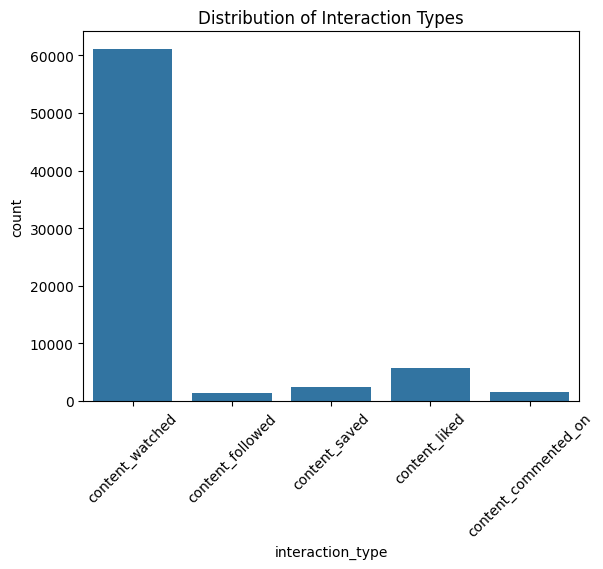

In [4]:
# Overview of Interaction Types
# Plot interaction type distribution
sns.countplot(data=consumer_transactions, x='interaction_type')
plt.title('Distribution of Interaction Types')
plt.xticks(rotation=45)
plt.show()


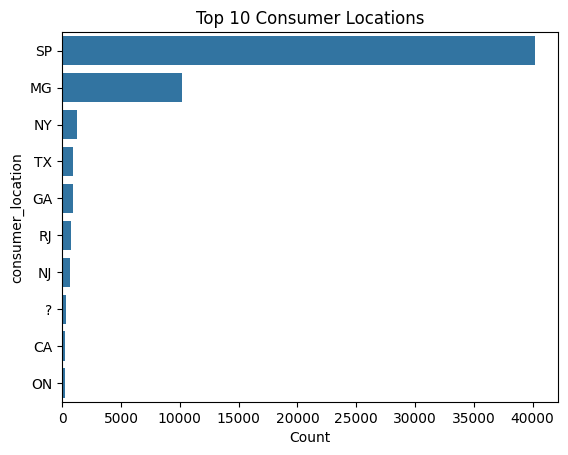

In [5]:
# Top 10 Consumer Locations
top_consumer_locations = consumer_transactions['consumer_location'].value_counts().head(10)
sns.barplot(x=top_consumer_locations.values, y=top_consumer_locations.index)
plt.title('Top 10 Consumer Locations')
plt.xlabel('Count')
plt.show()


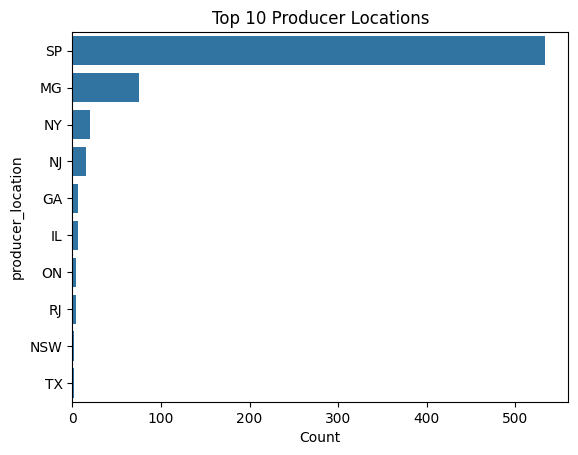

In [6]:
# Top 10 Producer Locations
top_producer_locations = platform_content['producer_location'].value_counts().head(10)
sns.barplot(x=top_producer_locations.values, y=top_producer_locations.index)
plt.title('Top 10 Producer Locations')
plt.xlabel('Count')
plt.show()

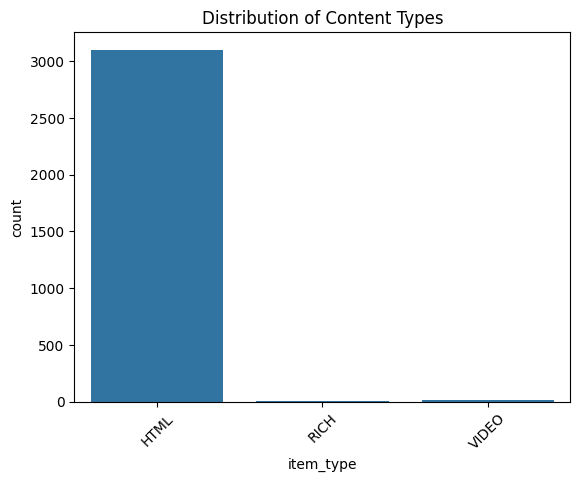

In [7]:
# Most Common Content Types
# Distribution of content types
sns.countplot(data=platform_content, x='item_type')
plt.title('Distribution of Content Types')
plt.xticks(rotation=45)
plt.show()


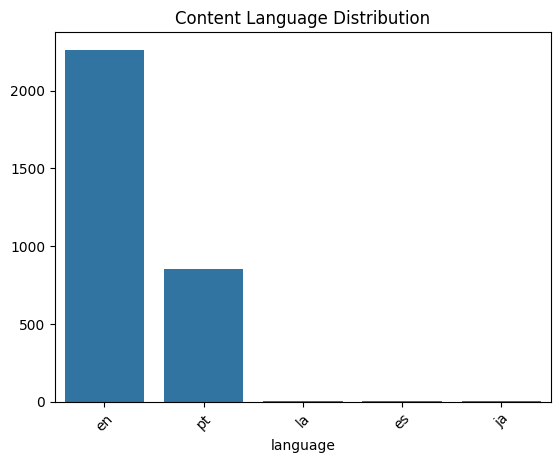

In [8]:
# Content Language Distribution
# Distribution of content languages
language_counts = platform_content['language'].value_counts()
sns.barplot(x=language_counts.index, y=language_counts.values)
plt.title('Content Language Distribution')
plt.xticks(rotation=45)
plt.show()


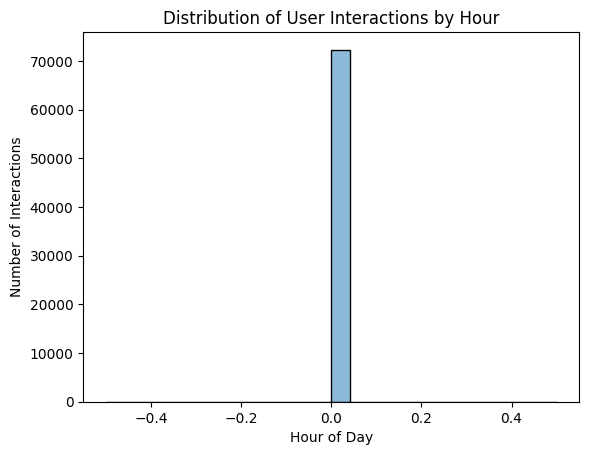

In [9]:
# Time Analysis of Interactions
# Convert timestamps to datetime and extract hours
consumer_transactions['interaction_hour'] = pd.to_datetime(consumer_transactions['event_timestamp']).dt.hour

# Plot hourly interaction distribution
sns.histplot(consumer_transactions['interaction_hour'], bins=24, kde=True)
plt.title('Distribution of User Interactions by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Interactions')
plt.show()


In [10]:
top_articles = consumer_transactions['item_id'].value_counts().head(10)
top_articles.index

Index([-4029704725707465084,  -133139342397538859,  8657408509986329668,
       -6783772548752091658, -6843047699859121724, -2358756719610361882,
       -8208801367848627943,  2581138407738454418, -1297580205670251233,
       -1633984990770981161],
      dtype='int64', name='item_id')

In [11]:
print("Top 10 popular articles by interaction count: \n")
top_articles = consumer_transactions['item_id'].value_counts().head(10)
top_articles_title = platform_content.loc[platform_content['item_id'].isin(top_articles.index), 'title'].values
for i,name in enumerate(top_articles_title):
    print(f'Top {i+1}: {name}')



Top 10 popular articles by interaction count: 

Top 1: Ganhe 6 meses de acesso ao Pluralsight, maior plataforma de treinamento online
Top 2: Pull request first - Practical Blend
Top 3: Novo workaholic trabalha, pratica esportes e tem tempo para a família. Conheça
Top 4: A minha viagem à Maternidade #tetodomundo
Top 5: Livro: Retrospectivas Divertidas
Top 6: Ray Kurzweil: The world isn't getting worse - our information is getting better
Top 7: 10 Modern Software Over-Engineering Mistakes
Top 8: UX ou UI?
Top 9: Custo do Erro - Cinco motivos para investir em automação de testes
Top 10: Former Google career coach shares a visual trick for figuring out what to do with your life


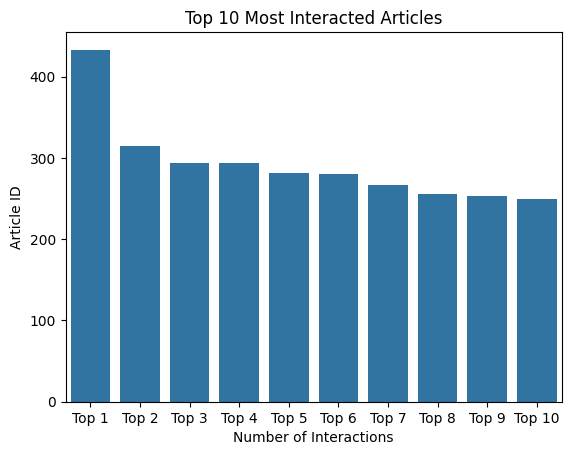

In [12]:
# Top Articles by Interaction Count
sns.barplot(
    x=[f'Top {i}' for i in np.arange(1,11)],
    y=top_articles.values
)
plt.title('Top 10 Most Interacted Articles')
plt.xlabel('Number of Interactions')
plt.ylabel('Article ID')
plt.show()


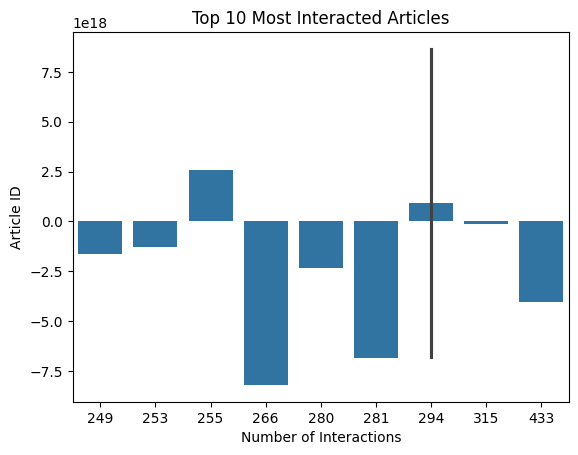

In [13]:
# Top Articles by Interaction Count
# Top 10 popular articles by interaction count
top_articles = consumer_transactions['item_id'].value_counts().head(10)
sns.barplot(x=top_articles.values, y=top_articles.index)
plt.title('Top 10 Most Interacted Articles')
plt.xlabel('Number of Interactions')
plt.ylabel('Article ID')
plt.show()


# Data Preprocessing
1. Impute ratings based on interaction type
2. Filter english content
3. Merge two datasets: consumer_transactions and platform_content
4. Data cleanup: make sure the merged dataset that contained English articles and content that was still present on the platform

## Impute Ratings Based on Interaction Type

In [14]:
interaction_weights = {
    "content_followed" : 5,
    "content_commented_on":4,
    "content_saved":3,
    "content_liked":2,
    "content_watched":1,
}
# Map interaction weights to consumer transactions
consumer_transactions['rating'] = consumer_transactions['interaction_type'].map(interaction_weights)

# Drop interactions without a defined weight
consumer_transactions = consumer_transactions.dropna(subset = ['rating'])
consumer_transactions.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72312 entries, 0 to 72311
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       72312 non-null  int64 
 1   interaction_type      72312 non-null  object
 2   item_id               72312 non-null  int64 
 3   consumer_id           72312 non-null  int64 
 4   consumer_session_id   72312 non-null  object
 5   consumer_device_info  56918 non-null  object
 6   consumer_location     56907 non-null  object
 7   country               56918 non-null  object
 8   interaction_hour      72312 non-null  int32 
 9   rating                72312 non-null  int64 
dtypes: int32(1), int64(4), object(5)
memory usage: 5.2+ MB


## Filter English content

In [15]:
# check list of language
list_language = set(platform_content['language'].values)
list_language

{'en', 'es', 'ja', 'la', 'pt'}

In [16]:
# Filter platform content to retain only Englist articles
english_platform_content = platform_content[platform_content['language']=='en']
english_platform_content.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2264 entries, 0 to 3121
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       2264 non-null   int64 
 1   interaction_type      2264 non-null   object
 2   item_id               2264 non-null   int64 
 3   producer_id           2264 non-null   int64 
 4   producer_session_id   2264 non-null   int64 
 5   producer_device_info  473 non-null    object
 6   producer_location     473 non-null    object
 7   producer_country      473 non-null    object
 8   item_type             2264 non-null   object
 9   item_url              2264 non-null   object
 10  title                 2264 non-null   object
 11  text_description      2264 non-null   object
 12  language              2264 non-null   object
dtypes: int64(4), object(9)
memory usage: 247.6+ KB


## Merge Dataset

In [17]:
# check consumer_transaction columns
print("consumer_transactions columns: ",consumer_transactions.columns)
# check platform_content columns
print("platform_content columns: ", english_platform_content.columns)

consumer_transactions columns:  Index(['event_timestamp', 'interaction_type', 'item_id', 'consumer_id',
       'consumer_session_id', 'consumer_device_info', 'consumer_location',
       'country', 'interaction_hour', 'rating'],
      dtype='object')
platform_content columns:  Index(['event_timestamp', 'interaction_type', 'item_id', 'producer_id',
       'producer_session_id', 'producer_device_info', 'producer_location',
       'producer_country', 'item_type', 'item_url', 'title',
       'text_description', 'language'],
      dtype='object')


In [18]:
# Merge consumer transactions and platform content on 'item_id' to connect interactions with content
# Removed unnecessary columns
merged_data = pd.merge(
    consumer_transactions,
    english_platform_content[["item_id", "title", "text_description", "item_type"]],
    on = 'item_id',
    how = 'inner',
)
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47262 entries, 0 to 47261
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       47262 non-null  int64 
 1   interaction_type      47262 non-null  object
 2   item_id               47262 non-null  int64 
 3   consumer_id           47262 non-null  int64 
 4   consumer_session_id   47262 non-null  object
 5   consumer_device_info  37030 non-null  object
 6   consumer_location     37021 non-null  object
 7   country               37030 non-null  object
 8   interaction_hour      47262 non-null  int32 
 9   rating                47262 non-null  int64 
 10  title                 47262 non-null  object
 11  text_description      47262 non-null  object
 12  item_type             47262 non-null  object
dtypes: int32(1), int64(4), object(8)
memory usage: 4.5+ MB


In [19]:
merged_data.describe()

,event_timestamp,item_id,consumer_id,interaction_hour,rating
count,4.726200e+04,4.726200e+04,4.726200e+04,47262.0,47262.000000
mean,1.469828e+09,-1.778617e+16,2.055031e+16,0.0,1.293788
std,7.302904e+06,5.374425e+18,4.928124e+18,0.0,0.805098
min,1.457964e+09,-9.192549e+18,-9.223122e+18,0.0,1.000000
25%,1.464735e+09,-4.798432e+18,-3.474152e+18,0.0,1.000000
50%,1.467631e+09,9.038349e+16,-2.295395e+17,0.0,1.000000
75%,1.474374e+09,4.579558e+18,3.636911e+18,0.0,1.000000
max,1.488310e+09,9.222265e+18,9.210531e+18,0.0,5.000000


## Data cleanup: make sure the dataset that contained English articles and content that was still present on the platform

In [20]:
# Remove articles that have been pulled out by filtering for only active content in platform content
active_content_ids = platform_content[platform_content['interaction_type'] == 'content_present']['item_id']
merged_data =  merged_data[merged_data['item_id'].isin(active_content_ids)]
merged_data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 47237 entries, 0 to 47261
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       47237 non-null  int64 
 1   interaction_type      47237 non-null  object
 2   item_id               47237 non-null  int64 
 3   consumer_id           47237 non-null  int64 
 4   consumer_session_id   47237 non-null  object
 5   consumer_device_info  37006 non-null  object
 6   consumer_location     36997 non-null  object
 7   country               37006 non-null  object
 8   interaction_hour      47237 non-null  int32 
 9   rating                47237 non-null  int64 
 10  title                 47237 non-null  object
 11  text_description      47237 non-null  object
 12  item_type             47237 non-null  object
dtypes: int32(1), int64(4), object(8)
memory usage: 4.9+ MB


# Model Building
1. Generate top 10 recommendations for a user with the help of user-based and item-based collaborative filtering models
2. Create user-item matrix with rating values
3. Find user-similarity and item-similarity matrices based on a similarity measure
4. Generate predicted ratings for all the user-item pairs and has generated the relevant list of item recommendations based on the similarity scores
5. Build a content-based filtering model using text processing to analyse the ‘keywords’ feature in the dataset and has recommended similar items based on the TF-IDF scores
6. Generate item and user recommendations using the ALS model by creating a compressed sparse user-item and item-user matrices.
7. Implementing hybrids of different types of models that help in recommending items that are similar to a particular item. (Hybrid recommendation model has been created by normalising the scores for content and collaborative filtering and combining them with appropriate weightage )

## Build Collaborative Filtering

### Create User-Item Matrix for Collaborative Filtering

In [21]:
# Pivot the data to create a user-item matrix
user_item_matrix = merged_data.pivot_table(
    index ='consumer_id',
    columns = 'item_id',
    values = 'rating',
    fill_value=0,
)
user_item_matrix

item_id,-9192549002213406534,-9190737901804729417,-9189659052158407108,-9171475473795142532,-9166778629773133902,-9160910454530522563,-9153494109165200346,-9152398073968262186,-9137036168156595470,-9128741757954228992,...,9151634133568930081,9158289456544908688,9168028029170358424,9207286802575546269,9208127165664287660,9209629151177723638,9215261273565326920,9217155070834564627,9220445660318725468,9222265156747237864
consumer_id,,,,,,,,,,,,,,,,,,,,,
-9223121837663643404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-9212075797126931087,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-9207251133131336884,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-9199575329909162940,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-9196668942822132778,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9165571805999894845,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9187866633451383747,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9191849144618614467,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
user_item_matrix.describe()

item_id,-9192549002213406534,-9190737901804729417,-9189659052158407108,-9171475473795142532,-9166778629773133902,-9160910454530522563,-9153494109165200346,-9152398073968262186,-9137036168156595470,-9128741757954228992,...,9151634133568930081,9158289456544908688,9168028029170358424,9207286802575546269,9208127165664287660,9209629151177723638,9215261273565326920,9217155070834564627,9220445660318725468,9222265156747237864
count,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,...,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000
mean,0.029197,0.002636,0.016880,0.003650,0.002433,0.010949,0.000608,0.000608,0.004866,0.018856,...,0.005677,0.001521,0.001217,0.007850,0.004866,0.003041,0.008577,0.004367,0.016880,0.003041
std,0.177215,0.053861,0.136458,0.085384,0.049281,0.104094,0.024663,0.024663,0.092181,0.146817,...,0.084476,0.044450,0.034868,0.092789,0.069609,0.055081,0.106653,0.074307,0.131345,0.055081
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2.000000,1.333333,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,...,2.000000,1.500000,1.000000,1.571429,1.000000,1.000000,2.500000,1.750000,1.500000,1.000000


### User-based collaborative filtering

In [23]:
# compute user similarity matrix
user_similarity = cosine_similarity(user_item_matrix)

# convert similarity scores into a DF
user_similarity_df = pd.DataFrame(user_similarity, index=user_item_matrix.index, columns=user_item_matrix.index)

# predict ratings for user-item pairs 
def predict_ratings_user_based(user_id, user_item_matrix, user_similarity_df, num_recommendations=10):
    # create similar items DF based on similar user
    similar_user = user_similarity_df[user_id].sort_values(ascending=False).iloc[1:] 
    user_ratings = user_item_matrix.loc[similar_user.index]
    weighted_ratings = user_ratings.T.dot(similar_user) / similar_user.sum()
    similar_items_df = weighted_ratings.sort_values(ascending=False).reset_index()
    similar_items_df.columns = ['item_id', 'score']
    # Remove all items belong to this user_id
    ids_to_remove =  consumer_transactions[consumer_transactions['consumer_id']==user_id]['item_id'].values
    filtered_df = similar_items_df[~similar_items_df['item_id'].isin(ids_to_remove)]
    # merge with title
    merged = pd.merge(filtered_df, english_platform_content[['item_id', 'title']], on='item_id', how='inner')
    collab_output = merged[merged['title'].notna()]
    # min max normalization
    collab_output['collaborative_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))
    recommendations = collab_output[['item_id','title','collaborative_score_normalized']]
    if num_recommendations == -1:
        return recommendations
    else:
        return recommendations[:num_recommendations]



In [24]:
#example usage:
user_id = random.choice(user_item_matrix.index)
top_10_user_based = predict_ratings_user_based(user_id, user_item_matrix, user_similarity_df,)
print(f"Top 10 User-based Recommendations with user_id {user_id}:\n {top_10_user_based}")

Top 10 User-based Recommendations with user_id -8543191472586917959:
                item_id                                              title  \
0  1469580151036142903  Don't document your code. Code your documentat...   
1 -8208801367848627943  Ray Kurzweil: The world isn't getting worse - ...   
2 -8992803137960175254  4 Reasons Managers Should Spend More Time on C...   
3  8586403905004879205  How to augment your career with leadership coa...   
4  7088167897470452815  Life Coach vs. Therapist, Learn the Difference...   
5 -4333957157636611418               Why Programmers Want Private Offices   
6  7526364197140419661                            Digital Health Coaching   
7 -5920475612630001479           How it feels to learn Javascript in 2016   
8 -6542996094878850014  How One Jira Ticket Made My Employer $1MM/Mont...   
9   569574447134368517                        Mastering Bash and Terminal   

   collaborative_score_normalized  
0                        1.000000  
1         

### Item-based Collaborative Filtering

In [25]:
# Compute item similarity matrix
item_similarity = cosine_similarity(user_item_matrix.T)

# Convert similarity scores into a DataFrame
item_similarity_df = pd.DataFrame(item_similarity, index=user_item_matrix.columns, columns=user_item_matrix.columns)

# Predict ratings for items
def predict_ratings_item_based(item_id, item_similarity_df, num_recommendations=10):
    similar_items = item_similarity_df[item_id].sort_values(ascending=False)
    similar_items_df = similar_items.reset_index()
    # Remove item_id
    similar_items_df = similar_items_df[similar_items_df['item_id'] != item_id]
    similar_items_df.columns = ['item_id', 'score']
    # merge with title
    merged = pd.merge(similar_items_df, english_platform_content[['item_id', 'title']], on='item_id', how='inner')
    collab_output = merged[merged['title'].notna()]
    # min max normalization
    collab_output['collaborative_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))
    recommendations = collab_output[['item_id','title','collaborative_score_normalized']]
    if num_recommendations == -1:
        return recommendations
    else:
        return recommendations[:num_recommendations]
    

In [26]:
#example usage:
item_id = random.choice(user_item_matrix.columns)
title_name = english_platform_content[english_platform_content['item_id']==item_id]['title'].values[0]
top_10_item_based = predict_ratings_item_based(item_id,item_similarity_df)
print(f"Top 10 Item-based Recommendations with {title_name}: \n {top_10_item_based}")

Top 10 Item-based Recommendations with ASIAN INNOVATION FRENZY | New Asia Trend Briefing from TrendWatching: 
                item_id                                              title  \
0 -3854488592949785912  Family photo sharing platform Togethera shutte...   
1  3321223121670148312  New South & Central America Trend Briefing fro...   
2  -340541651592032197  Relating a Problem Definition to IoT Architect...   
3 -3285620956704836473  The Top 10 Companies Millennials Want to Work For   
4 -8286289711960957081  Slack swips at Skype with video calls and reac...   
5  4333668738649701866  New Trend Briefing from TrendWatching | RECONC...   
6  6650072898902843826  Amex Canada Discovers 68% More Mobile-Driven C...   
7 -9103776596534246502  What Is a Good Retention Rate for Online Software   
8  6227065897176996407  6 New Tech Gadgets That Will Simplify Your Lif...   
9 -4608017393995766765  Graphene and Silly Putty Creates a Super-Sensi...   

   collaborative_score_normalized  
0    

## Content-Based Filtering Model
1. Using Dictionary, BOW, TFIDF model and Similarity Matrix
2. Using Tf-IDF Vectorizer

### 1. Using Dictionary, BOW, TFIDF model and Similarity Matrix

#### Data Preparation 

In [27]:
article_keywords = english_platform_content[['item_id', 'title', 'text_description']]
article_keywords.head()

,item_id,title,text_description
0,-6451309518266745024,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...
1,-4110354420726924665,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...
2,-7292285110016212249,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...
3,-6151852268067518688,Google Data Center 360° Tour,We're excited to share the Google Data Center ...
4,2448026894306402386,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...


In [28]:
# convert to numpy arrays
keywords_array = article_keywords['text_description'].to_numpy()
keywords_array

array(['All of this work is still very early. The first full public version of the Ethereum software was recently released, and the system could face some of the same technical and legal problems that have tarnished Bitcoin. Many Bitcoin advocates say Ethereum will face more security problems than Bitcoin because of the greater complexity of the software. Thus far, Ethereum has faced much less testing, and many fewer attacks, than Bitcoin. The novel design of Ethereum may also invite intense scrutiny by authorities given that potentially fraudulent contracts, like the Ponzi schemes, can be written directly into the Ethereum system. But the sophisticated capabilities of the system have made it fascinating to some executives in corporate America. IBM said last year that it was experimenting with Ethereum as a way to control real world objects in the so-called Internet of things. Microsoft has been working on several projects that make it easier to use Ethereum on its computing cloud, Azu

In [29]:
# Split keywords and create word list
words_list = []
for keyword in keywords_array:
    splitted_words = str(keyword).lower().split()
    words_list.append(splitted_words)

In [30]:
len(words_list), len(words_list[0]), len(words_list[1])

(2264, 1072, 1072)

#### Create Dictionary, BOW, TFIDF model and Similarity Matrix

In [31]:
# Create dictionary from word list
dictionary = Dictionary(words_list)
print(dictionary)


Dictionary<113180 unique tokens: ['"', '"a', '"bitcoin', '"blockchain:', '"ethereum']...>


In [32]:
#create corpus where the corpus is a bag of words for each document
corpus = [dictionary.doc2bow(doc) for doc in words_list]
corpus 

[[(0, 1),
  (1, 1),
  (2, 2),
  (3, 1),
  (4, 1),
  (5, 2),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 9),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 25),
  (24, 2),
  (25, 1),
  (26, 1),
  (27, 3),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 4),
  (32, 1),
  (33, 2),
  (34, 3),
  (35, 1),
  (36, 1),
  (37, 6),
  (38, 17),
  (39, 1),
  (40, 3),
  (41, 1),
  (42, 1),
  (43, 5),
  (44, 4),
  (45, 1),
  (46, 7),
  (47, 1),
  (48, 7),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 3),
  (57, 1),
  (58, 1),
  (59, 5),
  (60, 1),
  (61, 6),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 2),
  (67, 1),
  (68, 5),
  (69, 6),
  (70, 3),
  (71, 2),
  (72, 2),
  (73, 1),
  (74, 2),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 4),
  (88, 1),
  (89, 2),
  (90, 1),
  (91, 

In [33]:
#create tfidf model of the corpus
tfidf = TfidfModel(corpus) 
# Create the similarity matrix. This is the most important part where we get the similarities between the articles.
sims = MatrixSimilarity(tfidf[corpus], num_features=len(dictionary))
print(sims)

MatrixSimilarity<2264 docs, 113180 features>


#### For an input article, run the model and return the recommendation articles

In [34]:
def article_recommendation_1(article_title, article_keywords, dictionary, sims, num_recommendations=10):
    # get the article row
    article = article_keywords.loc[article_keywords.title==article_title] 
    
    #split the keywords
    keywords = article['text_description'].iloc[0].split() 

    #set the list of words to query_doc
    query_doc = keywords 
    
    # get a bag of words from the query_doc
    query_doc_bow = dictionary.doc2bow(query_doc) 

    #convert the regular bag of words model to a tf-idf model
    query_doc_tfidf = tfidf[query_doc_bow] 

    # get similarity values between input movie and all other movies
    similarity_array = sims[query_doc_tfidf] 

    #Convert to a Series
    similarity_series = pd.Series(similarity_array.tolist(), index=article_keywords.item_id.values) 

    #get the most similar movies 
    similar_items = similarity_series.sort_values(ascending=False)
    similar_items_df = similar_items.reset_index()
    
    # Remove item_id
    similar_items_df.columns = ['item_id', 'score']
    similar_items_df = similar_items_df[similar_items_df['item_id'] != item_id]
    
    # merge with title
    merged = pd.merge(similar_items_df, english_platform_content[['item_id', 'title']], on='item_id', how='inner')
    collab_output = merged[merged['title'].notna()]
    # min max normalization
    collab_output['content_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))
    recommendations = collab_output[['item_id','title','content_score_normalized']]
    if num_recommendations == -1:
        return recommendations
    else:
        return recommendations[:num_recommendations]
    

In [35]:
article_title = random.choice(english_platform_content['title'].values)
top_10_content_based = article_recommendation_1(article_title, article_keywords, dictionary, sims)
print(f"Top 10 Cotent Based Recommendations with {article_title}: \n {top_10_content_based}")

Top 10 Cotent Based Recommendations with Google admits original enterprise cloud strategy was wrong, why it's gone in a different direction - TechRepublic: 
                item_id                                              title  \
0  1128840733277618400  Google admits original enterprise cloud strate...   
1  4877833951599818487  Google Cloud Platform: The smart person's guid...   
2   -44082375822273498  How do you sell SaaS software to enterprise bu...   
3 -9033211547111606164  Google's Cloud Machine Learning service is now...   
4  1328618437884612347  Google Cloud Machine Learning family grows wit...   
5  5250363310227021277  How Google is Remaking Itself as a "Machine Le...   
6   638282658987724754                     Machine Learning for Designers   
7  -518690781085251687                What's the Best Cloud? Probably GCP   
8 -7126520323752764957  How Google is Remaking Itself as a "Machine Le...   
9  1929674614667189969  Diane Greene wants to put the enterprise front..

### 2. Using TfidfVectorizer

#### Data preparation

In [36]:
# Initalize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=5000)
tfidf_matrix = tfidf_vectorizer.fit_transform(english_platform_content['text_description'].fillna(''))

In [37]:
# Convert RF-IDF matrix to a DF with item_id as index
content_features = pd.DataFrame(
    tfidf_matrix.toarray(),
    index=english_platform_content['item_id'],
    columns = tfidf_vectorizer.get_feature_names_out(),
)
content_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2264 entries, -6451309518266745024 to 4109618890343020064
Columns: 5000 entries, 00 to zuul
dtypes: float64(5000)
memory usage: 86.4 MB


#### For an input article, run the model and return the recommendation articles

In [38]:
# Compute cosine similarity for content-based filtering
content_similarity = cosine_similarity(content_features)

# Convert similarity scores into a DataFrame
content_similarity_df = pd.DataFrame(content_similarity, index=content_features.index, columns=content_features.index)

# Recommend articles based on content
def article_recommendation_2(article_id, content_similarity_df, num_recommendations=10):
    similar_articles = content_similarity_df[article_id].sort_values(ascending=False)
    similar_items_df = similar_articles.reset_index()
    # Remove item_id
    similar_items_df = similar_items_df[similar_items_df['item_id'] != article_id]
    similar_items_df.columns = ['item_id', 'score']
    # merge with title
    collab_output = pd.merge(similar_items_df, english_platform_content[['item_id', 'title']], on='item_id', how='left')
    # collab_output = merged[merged['title'].notna()]
    # min max normalization
    collab_output['content_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))
    recommendations = collab_output[['item_id','title','content_score_normalized']]
    if num_recommendations == -1:
        return recommendations
    else:
        return recommendations[:num_recommendations]
    


In [39]:
article_id = random.choice(merged_data['item_id'].values)
article_title = merged_data[merged_data['item_id']==article_id]['title'].values[0]
top_10_content_based = article_recommendation_2(article_id, content_similarity_df)
print(f"Top 10 Cotent Based Recommendations with Article {article_title} are \n {top_10_content_based}")

Top 10 Cotent Based Recommendations with Article Why Programmers Want Private Offices are 
                item_id                                              title  \
0 -4996336942690402156                               Live asynchronously.   
1  4804093434821394840  Mining in Space Could Lead to Conflicts on Ear...   
2  5271205718596251417                   9 Rules of Open-Office Etiquette   
3  6377566860234930618  How to Create a Unified Culture in a Company W...   
4 -8800029253812071912  Facebook Workplace officially launches on the ...   
5  5270696484536580646               8 Insanely Simple Productivity Hacks   
6  7424795099560672335  7 Tips to Create a Company Learning Culture li...   
7 -6765871608738223618     10 Simple Habits of Insanely Productive People   
8 -7876497512693688413             The Joel Test: 12 Steps to Better Code   
9  -749116597676471759         Introducing unlimited private repositories   

   content_score_normalized  
0                  1.000000  


## ALS Model

### Data Preparation

In [40]:
# Reset index to convert the consumer_id index into a column
user_item_flat = user_item_matrix.reset_index()

# Melt the DataFrame to reshape it into the desired format
user_item_df = user_item_flat.melt(id_vars='consumer_id', var_name='item_id', value_name='rating')

# Optionally, filter out rows with zero ratings (if not needed)
user_item_df = user_item_df[user_item_df['rating'] > 0].reset_index(drop=True)
print("describe: \n", user_item_df.describe())
print("head: \n", user_item_df.head())



describe: 
         consumer_id        rating
count  2.619300e+04  26193.000000
mean  -4.681425e+15      1.157891
std    5.038322e+18      0.401680
min   -9.223122e+18      1.000000
25%   -3.596627e+18      1.000000
50%   -8.938893e+16      1.000000
75%    3.813843e+18      1.000000
max    9.210531e+18      4.500000
head: 
            consumer_id               item_id  rating
0 -9016528795238256703  -9192549002213406534     1.0
1 -9001583565812478106  -9192549002213406534     1.0
2 -8860671864164757449  -9192549002213406534     1.0
3 -8845298781299428018  -9192549002213406534     1.0
4 -8550167523008133722  -9192549002213406534     1.0


In [41]:
# Map consumer_id and item_id to numeric indices
user_item_df['user_index'] = user_item_df['consumer_id'].astype('category').cat.codes
user_item_df['item_index'] = user_item_df['item_id'].astype('category').cat.codes

print("describe: \n", user_item_df.describe())
print("head: \n", user_item_df.head())

describe: 
         consumer_id        rating    user_index    item_index
count  2.619300e+04  26193.000000  26193.000000  26193.000000
mean  -4.681425e+15      1.157891    827.620624   1055.652083
std    5.038322e+18      0.401680    447.074399    617.786931
min   -9.223122e+18      1.000000      0.000000      0.000000
25%   -3.596627e+18      1.000000    524.000000    523.000000
50%   -8.938893e+16      1.000000    816.000000   1063.000000
75%    3.813843e+18      1.000000   1174.000000   1573.000000
max    9.210531e+18      4.500000   1643.000000   2148.000000
head: 
            consumer_id               item_id  rating  user_index  item_index
0 -9016528795238256703  -9192549002213406534     1.0          17           0
1 -9001583565812478106  -9192549002213406534     1.0          20           0
2 -8860671864164757449  -9192549002213406534     1.0          28           0
3 -8845298781299428018  -9192549002213406534     1.0          32           0
4 -8550167523008133722  -919254900221

In [42]:
# Convert user-item matrix to sparse format
alpha = 1
sparse_user_item = csr_matrix( ([alpha]*user_item_df.shape[0], (user_item_df['user_index'], user_item_df['item_index']) ))
sparse_user_item.shape

(1644, 2149)

In [43]:
train, test = train_test_split(sparse_user_item, train_percentage=0.8)

### Recommendation for user and similar items

In [44]:
from implicit.als import AlternatingLeastSquares

# Initialize ALS model
als_model = AlternatingLeastSquares(factors=20, regularization=0.1, iterations=50)

# Train the model on the sparse matrix
als_model.fit(train)  # Note: implicit expects items x users matrix


/Users/cuong/anaconda3/envs/rag_helpmate/lib/python3.10/site-packages/implicit/cpu/als.py:95: RuntimeWarning: OpenBLAS is configured to use 8 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.
  check_blas_config()
100%|██████████| 50/50 [00:00<00:00, 109.44it/s]


In [45]:
def recommend_for_user(user_id, user_item_df,als_model,english_platform_content, num_recommendations=10):
    # Get the user's index in the ALS model
    user_index = user_item_df.loc[user_item_df['consumer_id'] == user_id, 'user_index'].values[0]

    # Get recommended item indices and scores from the ALS model
    similar_items, scores = als_model.recommend(user_index, sparse_user_item[user_index], N=num_recommendations)
    item_ids = [np.int64(user_item_df[user_item_df['item_index']==id]['item_id'].values[0]) for id in similar_items]
    # print('item_ids:', item_ids)
    # print('scores:',scores)
    similar_items_df = pd.DataFrame({
                'item_index': similar_items,
                'item_id': item_ids,
                'score': scores,
            })
    already_interacted = np.in1d(similar_items_df['item_index'], sparse_user_item[user_index].indices)
    # merge with title
    collab_output = pd.merge(similar_items_df, english_platform_content[['item_id', 'title']], on='item_id', how='left')
    collab_output['already_liked'] = already_interacted
    # collab_output = merged[merged['title'].notna()]
    # min max normalization
    collab_output['als_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))
    recommendations = collab_output[['item_id','score','title','als_score_normalized', 'already_liked']]
    return recommendations
    

# Example: Recommend for a specific user
user_id = random.choice(merged_data['consumer_id'])
recommended_items = recommend_for_user(user_id,user_item_df,als_model,english_platform_content)
print("Recommended items: \n ", recommended_items)


Recommended items: 
                 item_id     score  \
0   569574447134368517  0.169338   
1   -14569272361926584  0.132441   
2 -4333957157636611418  0.108018   
3 -6728844082024523434  0.107502   
4  1873952032843878490  0.100647   
5 -5148591903395022444  0.099590   
6 -1878128207048892154  0.097794   
7 -3780822597455574960  0.091601   
8  3091351089612339864  0.088301   
9 -4996336942690402156  0.085404   

                                               title  als_score_normalized  \
0                        Mastering Bash and Terminal              1.000000   
1  Java 8 Streams - A Deeper Approach About Perfo...              0.560403   
2               Why Programmers Want Private Offices              0.269424   
3                                          Seniority              0.263274   
4                            Hype Driven Development              0.181604   
5                      Anti-If: The missing patterns              0.169019   
6        The Ten Commandments of Eg

In [46]:
def recommend_similar_item(item_id,user_item_df,als_model,english_platform_content, num_recommendations=10):
    # user_id is from the original data 
    item_index = user_item_df[user_item_df['item_id']==item_id]['item_index'].values[0]
    similar_items, scores = als_model.similar_items(item_index, N=num_recommendations+1) # N = num_recommendation + 1 to remove the item_id input
    item_ids = [np.int64(user_item_df[user_item_df['item_index']==id]['item_id'].values[0]) for id in similar_items]
    # print('item_ids:', item_ids)
    # print('scores:',scores)
    similar_items_df = pd.DataFrame({'item_id': item_ids[1:],
                'score': scores[1:]
                })
    # merge with title
    collab_output = pd.merge(similar_items_df, english_platform_content[['item_id', 'title']], on='item_id', how='left')
    # collab_output = merged[merged['title'].notna()]
    # min max normalization
    collab_output['als_score_normalized'] = (collab_output['score']-min(collab_output['score']))/(max(collab_output['score'])-min(collab_output['score']))
    recommendations = collab_output[['item_id','score','title','als_score_normalized']]
    return recommendations

# Example: Recommend for a specific user
item_id = random.choice(merged_data['item_id'])
recommended_items = recommend_similar_item(item_id, user_item_df,als_model,english_platform_content,)
print("Recommended items: \n ", recommended_items)

Recommended items: 
                 item_id     score  \
0  6045455576279706291  0.792772   
1  8982094176562780806  0.768026   
2 -7474372733748503487  0.759563   
3 -1625217607550912638  0.749482   
4 -1501277643953505671  0.739257   
5 -3876501423599932851  0.725814   
6    54678605145828343  0.725003   
7 -5602127731550819348  0.710445   
8  -703416562539077070  0.706289   
9 -5179258585851879449  0.696809   

                                               title  als_score_normalized  
0  Google isn't abandoning Hangouts for its new c...              1.000000  
1  How Neuroscientists Explain the Mind-Clearing ...              0.742136  
2  Estonia wants to become a 'country as a servic...              0.653939  
3  Google made a huge change to the way Google Ma...              0.548894  
4       Introduction - Material Design for Wearables              0.442338  
5  The inside story of how Amazon created Echo, t...              0.302255  
6            Is machine learning the next 

## Build Hybrid recommendation
1. Content + Item-based collaborative model
3. ALS + User-based collaborative model
2. ALS + Item-based collaborative model
4. ALS + Content-based collaborative model


### Content + Item-based collaborative model


In [47]:
def hybrid_content_item(item_id,content_similarity_df,item_similarity_df, num_recommendations=10):
    content_based = article_recommendation_2(item_id, content_similarity_df, num_recommendations= -1)
    item_based = predict_ratings_item_based(item_id,item_similarity_df, num_recommendations=-1)
    hybrid_output = pd.merge(item_based, content_based, how='outer', on='item_id')
    hybrid_output['final_score'] = (hybrid_output['collaborative_score_normalized'] + hybrid_output['content_score_normalized'])/2
    result = hybrid_output[['title_x','final_score']]
    result.columns = ['title', 'score']
    return result.sort_values(by='score', ascending=False)[:num_recommendations]

article_id = random.choice(merged_data['item_id'].values)
article_title = merged_data[merged_data['item_id']==article_id]['title'].values[0]
recommendations = hybrid_content_item(item_id,content_similarity_df,item_similarity_df)
print("Recommendation for Article: ", article_title)
print(recommendations)

Recommendation for Article:  Behind Facebook Messenger's plan to be an app platform
                                                  title     score
129   Picture a Better You: How Google Calendar Uses...  0.683484
464       Google : End Of The Online Advertising Bubble  0.609263
2320  Robotics, VR Content Take Center Stage at CES,...  0.595928
534   Why 5 is the magic number for UX usability tes...  0.593270
1762  Mapping the World of Music Using Machine Learn...  0.573154
1163  Calm down: Google's use of Material Design on ...  0.557470
406   Face recognition app taking Russia by storm ma...  0.550869
1583                 What exactly is a design culture?   0.546599
621   How to Avoid Building Bad Products with Rapid ...  0.540835
2005  Margaret Gould Stewart: How giant websites des...  0.538152


### ALS + User-based collaborative model

In [50]:
def hybrid_asl_user(user_id,user_item_df,user_item_matrix,user_similarity_df,als_model,english_platform_content, num_recommendations=10):
    user_based = predict_ratings_user_based(user_id, user_item_matrix, user_similarity_df,num_recommendations=-1)
    als = recommend_for_user(user_id,user_item_df,als_model,english_platform_content)

    # Merge both results
    hybrid = pd.merge(user_based, als, on='item_id', how='outer', suffixes=('_user', '_als'))

    # Fill missing scores with 0 (or another baseline if desired)
    hybrid['collaborative_score_normalized'] = hybrid['collaborative_score_normalized'].fillna(0)
    hybrid['als_score_normalized'] = hybrid['als_score_normalized'].fillna(0)

    # Calculate hybrid score (e.g., average of the two scores)
    hybrid['hybrid_score'] = (hybrid['collaborative_score_normalized'] + hybrid['als_score_normalized']) / 2

    # Sort by hybrid score in descending order
    hybrid = hybrid.sort_values(by='hybrid_score', ascending=False)

    return hybrid[['item_id', 'title_user', 'hybrid_score']][:num_recommendations]

user_id = random.choice(merged_data['consumer_id'])
recommendations = hybrid_asl_user(user_id,user_item_df,user_item_matrix,user_similarity_df,als_model,english_platform_content,)
print("Recommendation for user_id: ", user_id)
print(recommendations)

Recommendation for user_id:  -1443636648652872475
                  item_id                                         title_user  \
925   1469580151036142903  Don't document your code. Code your documentat...   
107  -8208801367848627943  Ray Kurzweil: The world isn't getting worse - ...   
469  -4029704725707465084  Former Google career coach shares a visual tri...   
1023  2581138407738454418       10 Modern Software Over-Engineering Mistakes   
1121  3495098006178009360  A Googler analyzed a billion files to settle t...   
1631  8890720798209849691                     Top 10 Intranet Trends of 2016   
1532  7814856426770804213  New MacBook Pro is not a Laptop for Developers...   
1085  3149164017776669829                   Mobile marketing statistics 2016   
1335  5854206600849997966              The hardest thing in computer science   
438  -4333957157636611418               Why Programmers Want Private Offices   

      hybrid_score  
925       0.775237  
107       0.500000  
469   

### ALS + Item-based collaborative model

In [51]:
als = recommend_similar_item(item_id,user_item_df,als_model,english_platform_content, num_recommendations=10)
als


,item_id,score,title,als_score_normalized
0,6045455576279706291,0.792772,Google isn't abandoning Hangouts for its new c...,1.000000
1,8982094176562780806,0.768026,How Neuroscientists Explain the Mind-Clearing ...,0.742136
2,-7474372733748503487,0.759563,Estonia wants to become a 'country as a servic...,0.653939
3,-1625217607550912638,0.749482,Google made a huge change to the way Google Ma...,0.548894
4,-1501277643953505671,0.739257,Introduction - Material Design for Wearables,0.442338
5,-3876501423599932851,0.725814,"The inside story of how Amazon created Echo, t...",0.302255
6,54678605145828343,0.725003,Is machine learning the next commodity?,0.293803
7,-5602127731550819348,0.710445,The Top 10 Most Common Mistakes That Node.js D...,0.142096
8,-703416562539077070,0.706289,Scrum Community - Scrum Alliance,0.098785
9,-5179258585851879449,0.696809,The insurance tech equation,0.000000


In [52]:
item_based = predict_ratings_item_based(item_id,item_similarity_df, num_recommendations=-1)
item_based

,item_id,title,collaborative_score_normalized
0,5688279681867464747,Margaret Gould Stewart: How giant websites des...,1.000000
1,-4351117979148287331,Pastejacking,0.994493
2,-5820943153819992582,Google : End Of The Online Advertising Bubble,0.994493
3,-5405021817466310759,Why 5 is the magic number for UX usability tes...,0.937617
4,2736373711035411385,What exactly is a design culture?,0.931122
...,...,...,...
2187,-1151034582628982912,New JavaScript library brings Java to browsers...,0.000000
2188,-1173087925894083974,AI can learn from data without ever having acc...,0.000000
2189,-1192619987285372590,Apache Spark 2.0 Preview: Machine Learning Mod...,0.000000
2190,-1199490911632553070,Our password hashing has no clothes,0.000000


In [54]:
def hybrid_als_item(item_id,user_item_df,item_similarity_df,als_model,english_platform_content,num_recommendations=10):
    als = recommend_similar_item(item_id,user_item_df,als_model,english_platform_content, num_recommendations=num_recommendations)
    item_based = predict_ratings_item_based(item_id,item_similarity_df, num_recommendations=-1)
    hybrid_output = pd.merge(item_based, als, how='outer', on='item_id')

    hybrid_output['final_score'] = (hybrid_output['collaborative_score_normalized'] + hybrid_output['als_score_normalized'])/2
    result = hybrid_output[['title_x','final_score']]
    result.columns = ['title', 'score']
    return result.sort_values(by='score', ascending=False)[:num_recommendations]

article_id = random.choice(merged_data['item_id'].values)
article_title = merged_data[merged_data['item_id']==article_id]['title'].values[0]
recommendations = hybrid_als_item(item_id,user_item_df,item_similarity_df,als_model,english_platform_content,)
print("Recommendation for Article: ", article_title)
print(recommendations)

Recommendation for Article:  How to build cross-platform mobile apps using nothing more than a JSON markup
                                                  title     score
1794  Google isn't abandoning Hangouts for its new c...  0.717992
2163  How Neuroscientists Explain the Mind-Clearing ...  0.640336
1080            Is machine learning the next commodity?  0.552901
903        Introduction - Material Design for Wearables  0.552667
649   The inside story of how Amazon created Echo, t...  0.548925
888   Google made a huge change to the way Google Ma...  0.524912
213   Estonia wants to become a 'country as a servic...  0.498843
490                         The insurance tech equation  0.296501
436   The Top 10 Most Common Mistakes That Node.js D...  0.212399
991                    Scrum Community - Scrum Alliance  0.171460


# Model Evaluation
Requirement:
1. Model has been evaluated using an appropriate metric.
2. The logic behind choosing the metric has been clearly explained.